<a href="https://colab.research.google.com/github/JoshuaCoutinho24/CVIP-Data-Science-Intern/blob/main/Mobile_Price_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
import sys, time, os, warnings
import numpy as np
import pandas as pd
from collections import Counter
from tensorflow.keras.preprocessing.image import load_img, img_to_array


In [22]:
! pip install -q kaggle

from google.colab import files


files.upload()


! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/


! chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle (1).json
mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [23]:
!kaggle datasets download -d gauravduttakiit/mobile-price-classification

100% 72.5k/72.5k [00:00<00:00, 641kB/s]
100% 72.5k/72.5k [00:00<00:00, 639kB/s]


In [24]:
! unzip /content/mobile-price-classification.zip

Archive:  /content/mobile-price-classification.zip
  inflating: sample.csv              
  inflating: test.csv                
  inflating: train.csv               


In [29]:
train=pd.read_csv('/content/train.csv')
train

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 62.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 361.8/361.8 kB 39.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 105.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 104.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 93.5 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of panel to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 76.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 31.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.0/20.0 MB 21.7 MB/s eta 0:00:00

Imported v0.1.730. After importing autoviz, execute '%matplotlib inline' to display charts inline.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (2000, 21)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    20 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
Since Number of Rows in data 2000 exceeds maximum, randomly sampling 2000 rows for EDA...

################ Multi_Classification problem #####################
To fix data quality issues automatically, import FixDQ 

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
battery_power,int64,0.000000,54,501.000000,1998.000000,No issue
blue,int64,0.000000,0,0.000000,1.000000,No issue
clock_speed,float64,0.000000,NA,0.500000,3.000000,No issue
dual_sim,int64,0.000000,0,0.000000,1.000000,No issue
fc,int64,0.000000,1,0.000000,19.000000,has 18 outliers greater than upper bound (16.00) or lower than lower bound(-8.00). Cap them or remove them.
four_g,int64,0.000000,0,0.000000,1.000000,No issue
int_memory,int64,0.000000,3,2.000000,64.000000,No issue
m_dep,float64,0.000000,NA,0.100000,1.000000,No issue
mobile_wt,int64,0.000000,6,80.000000,200.000000,No issue
n_cores,int64,0.000000,0,1.000000,8.000000,No issue


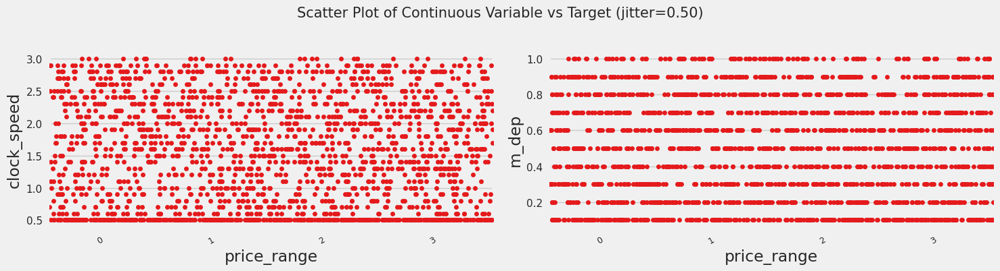

Total Number of Scatter Plots = 3


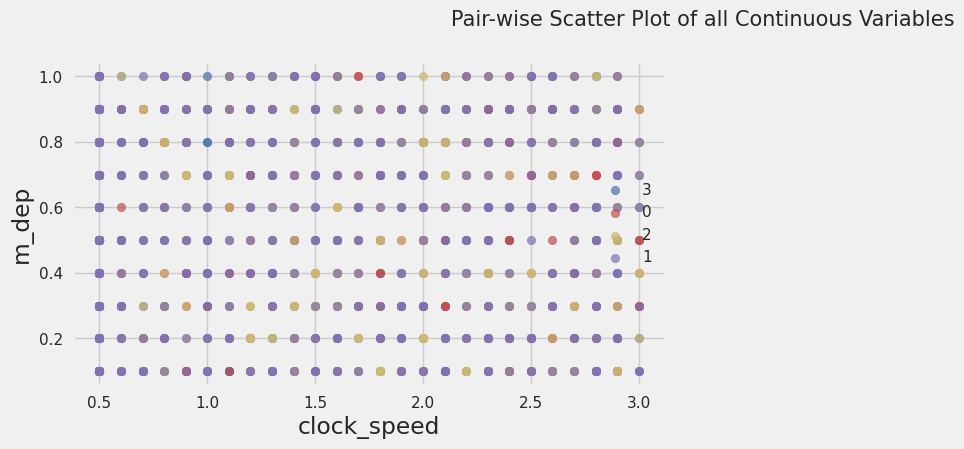

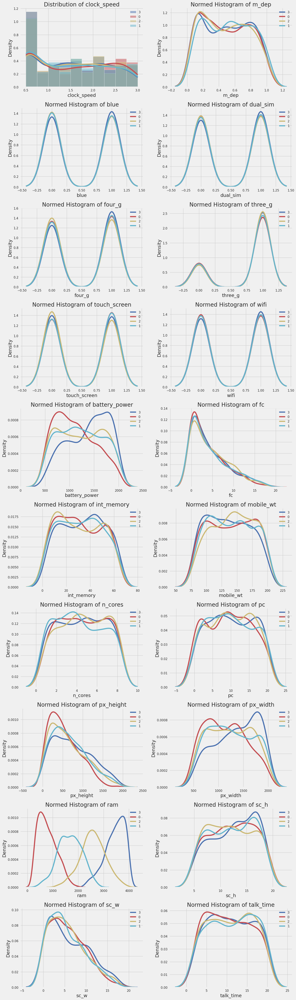

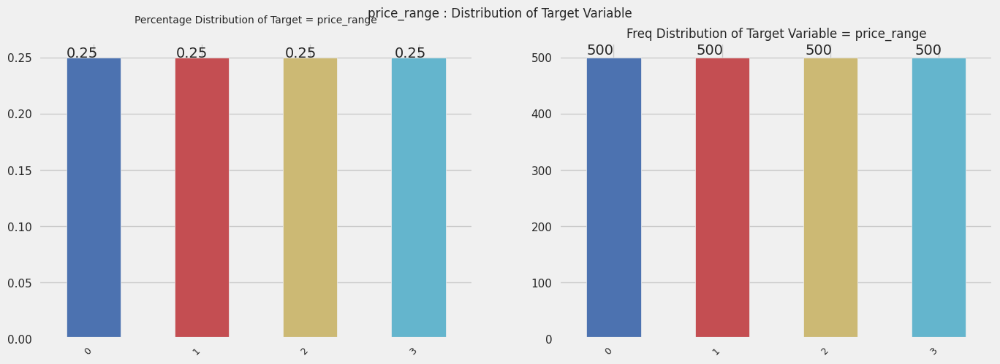

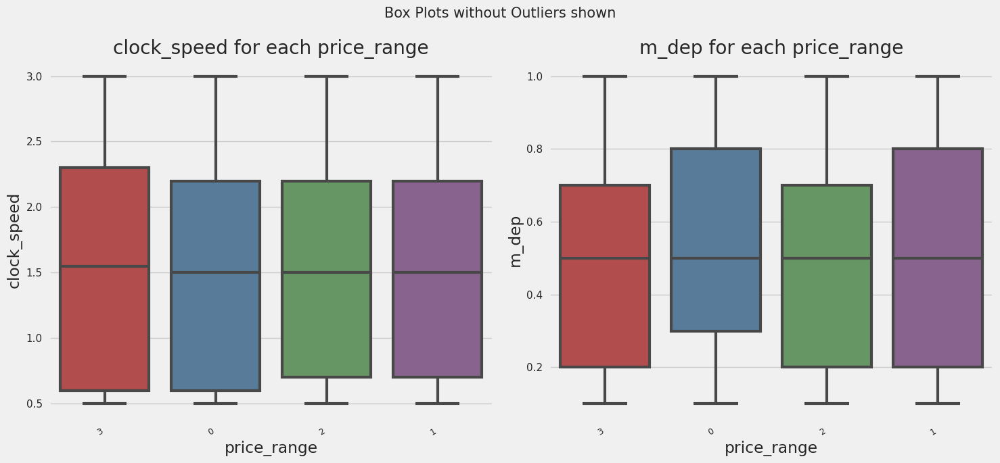

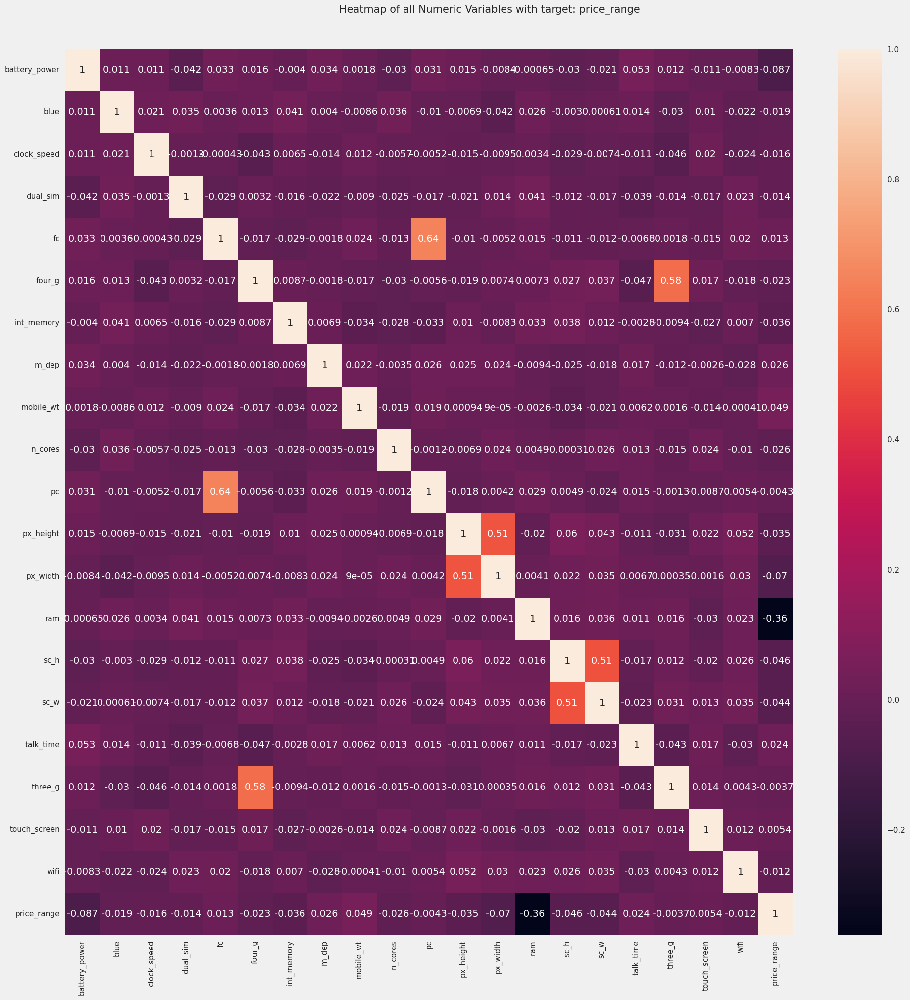

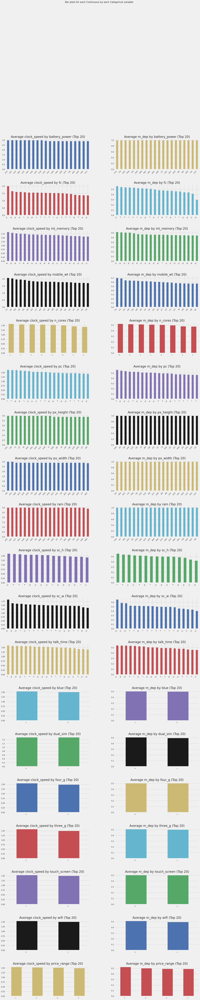

All Plots done
Time to run AutoViz = 27 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
405,1454,1,0.5,1,1,0,34,0.7,83,4,3,250,1033,3419,7,5,5,1,1,0,0
1190,1092,1,0.5,1,10,0,11,0.5,167,3,14,468,571,737,14,4,11,0,1,0,1
1132,1524,1,1.8,1,0,0,10,0.6,174,4,1,154,550,2678,16,5,13,1,0,1,2
731,1807,1,2.1,0,2,0,49,0.8,125,1,10,337,1384,1906,17,13,13,0,1,1,2
1754,1086,1,1.7,1,0,1,43,0.2,111,6,1,56,1150,3285,11,5,17,1,1,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
835,1224,1,1.6,0,9,0,33,1.0,157,1,18,522,563,3796,10,5,13,1,1,0,0
1216,1158,0,0.7,1,1,1,29,0.7,123,2,20,311,1796,1542,17,9,15,1,0,1,3
1653,1190,0,2.0,1,0,0,40,0.2,93,5,1,1399,1646,3610,13,7,9,0,0,1,0
559,1191,0,2.4,1,2,0,13,0.9,169,1,7,179,1813,1028,14,6,8,1,1,1,1


In [30]:
!pip install autoviz
from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline
AV = AutoViz_Class()
AV.AutoViz(filename='',dfte=train,depVar='price_range',verbose=1,max_rows_analyzed=train.shape[0]
               ,max_cols_analyzed=train.shape[1])

In [32]:
test=pd.read_csv('/content/test.csv')
test=test.drop(['id'],axis=1)

In [33]:
test

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1043,1,1.8,1,14,0,5,0.1,193,3,16,226,1412,3476,12,7,2,0,1,0
1,841,1,0.5,1,4,1,61,0.8,191,5,12,746,857,3895,6,0,7,1,0,0
2,1807,1,2.8,0,1,0,27,0.9,186,3,4,1270,1366,2396,17,10,10,0,1,1
3,1546,0,0.5,1,18,1,25,0.5,96,8,20,295,1752,3893,10,0,7,1,1,0
4,1434,0,1.4,0,11,1,49,0.5,108,6,18,749,810,1773,15,8,7,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1700,1,1.9,0,0,1,54,0.5,170,7,17,644,913,2121,14,8,15,1,1,0
996,609,0,1.8,1,0,0,13,0.9,186,4,2,1152,1632,1933,8,1,19,0,1,1
997,1185,0,1.4,0,1,1,8,0.5,80,1,12,477,825,1223,5,0,14,1,0,0
998,1533,1,0.5,1,0,0,50,0.4,171,2,12,38,832,2509,15,11,6,0,1,0


In [36]:
x= train
y = train.pop('price_range')


KeyError: ignored

In [37]:

from sklearn.model_selection import train_test_split

xtrain, xtest, ytrain, ytest = train_test_split( x, y, test_size=0.33, random_state=42,shuffle=True, stratify=y)


In [35]:
pip install lazypredict

In [42]:
from lazypredict.Supervised import LazyClassifier
clf = LazyClassifier(verbose=0,predictions=True)
models,predictions = clf.fit(xtrain, xtest, ytrain, ytest)


 97%|█████████▋| 28/29 [00:03<00:00,  6.80it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1369
[LightGBM] [Info] Number of data points in the train set: 1340, number of used features: 20
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Info] Start training from score -1.386294
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


100%|██████████| 29/29 [00:04<00:00,  6.00it/s]


In [43]:
models

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LogisticRegression,0.96,0.96,None,0.96,0.04
LinearDiscriminantAnalysis,0.94,0.94,None,0.94,0.04
QuadraticDiscriminantAnalysis,0.93,0.93,None,0.93,0.01
XGBClassifier,0.92,0.92,None,0.92,0.65
LGBMClassifier,0.91,0.91,None,0.91,0.83
BaggingClassifier,0.88,0.88,None,0.88,0.11
NuSVC,0.88,0.88,None,0.88,0.16
SVC,0.88,0.88,None,0.88,0.17
RandomForestClassifier,0.87,0.87,None,0.87,0.37


In [44]:
from sklearn.linear_model import LogisticRegression
clf2 = LogisticRegression()
clf2.fit(xtrain,ytrain)

LogisticRegression()

In [45]:
ypreds = clf2.predict(xtest)

In [47]:
from sklearn.metrics import classification_report

print(classification_report(ytest, ypreds,target_names=['low cost','medium cost',
                                                                     'high cost','very high cost']))

                precision    recall  f1-score   support

      low cost       0.84      0.80      0.82       165
   medium cost       0.53      0.50      0.51       165
     high cost       0.45      0.44      0.45       165
very high cost       0.68      0.75      0.71       165

      accuracy                           0.62       660
     macro avg       0.62      0.62      0.62       660
  weighted avg       0.62      0.62      0.62       660

